In [9]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

In [30]:
def time_decorator(func):
    from time import time
    def wrapper(*arge, **kwarge):
        tic = time()
        result = func(*arge, **kwarge)
        toc = time()
        print(f"{func.__name__} took {toc-tic:.4} sec")
        return result
    return wrapper

In [21]:
@time_decorator
def displayImageActualSize(img):
    import matplotlib as mpl
    dpi = mpl.rcParams['figure.dpi']
    H, W = img.shape
    figsize = H/float(dpi), W/float(dpi)
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])
    ax.axis('off')
    ax.imshow(img, cmap='gray')
    plt.show()

In [22]:
img = cv.imread('einstein.jpg', cv.IMREAD_GRAYSCALE)

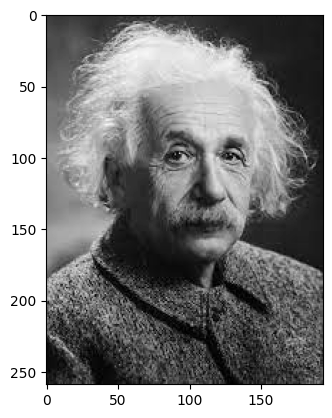

In [23]:
plt.imshow(img, cmap='gray')

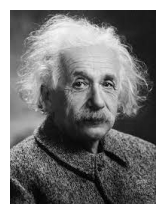

displayImageActualSize took 0.05418 sec


In [24]:
displayImageActualSize(img)

# image transformation: P' = SP
p: source image
s: scale matrix
p': destination image

### we want double the image size 

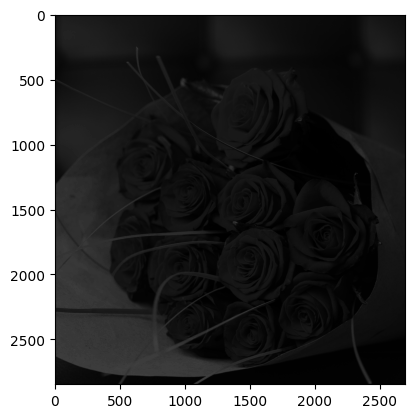

In [81]:
img = cv.imread('redRose.png', cv.IMREAD_GRAYSCALE)
rows, cols = img.shape
img2 = np.zeros((2*rows, 2*cols), dtype=np.uint8)
for i in range (rows):
    for j in range(cols):
        p = np.array([i, j])
        p_prim = np.dot(s, p)
        
        new_i, new_j = p_prim
        img2[new_i, new_j] = img[i, j]

plt.imshow(img2, cmap='gray')
plt.show()

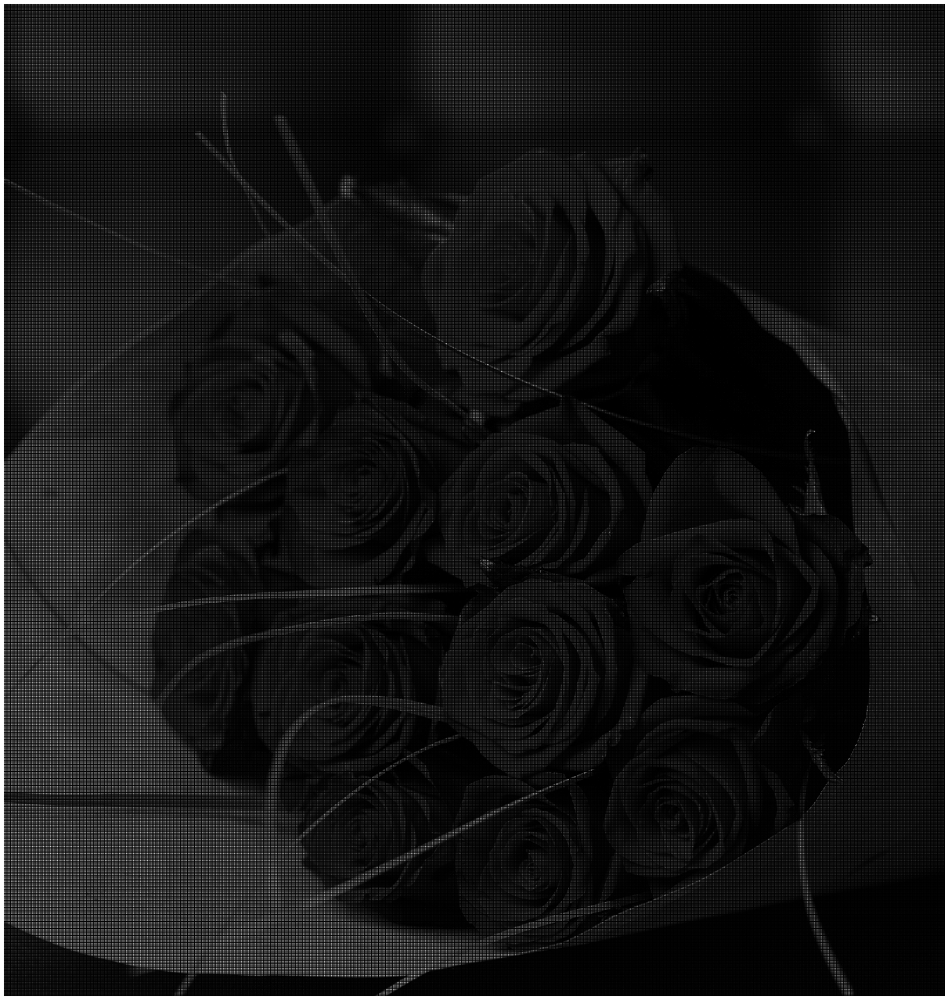

In [82]:
displayImageActualSize(img2)

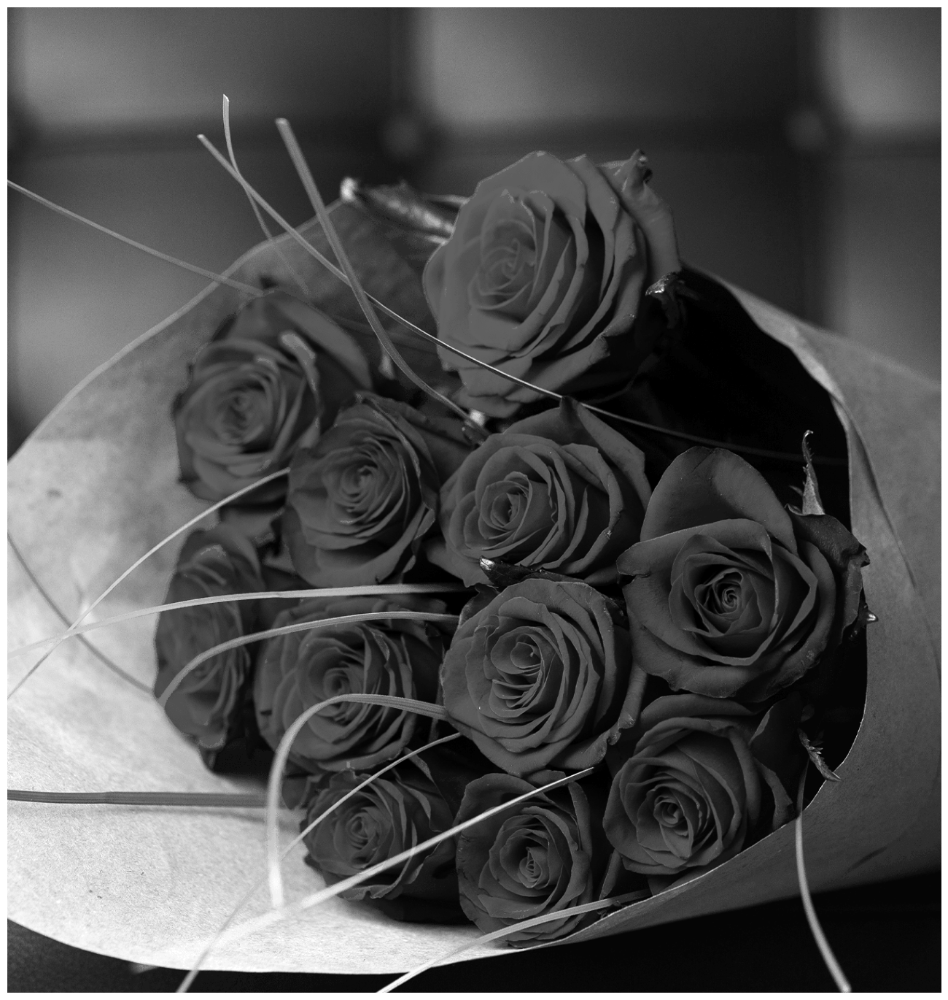

In [83]:
displayImageActualSize(img)

In [4]:
# vectorize doube size image without 'for' loop
def copy_img(image, s):
    p_prim = np.dot(s, [1, 1])
    x_step, y_step = p_prim
    
    rows, cols = image.shape
    img2 = np.zeros((x_step*rows, y_step*cols), dtype=np.uint8)
    img2[::x_step, ::y_step] = image[:, :]
            
    return img2

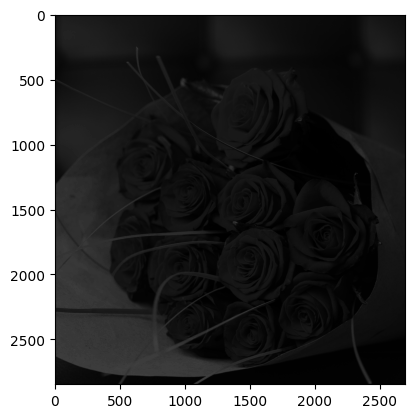

In [132]:
img = cv.imread('redRose.png', cv.IMREAD_GRAYSCALE)
new = copy_img(img, s)
plt.imshow(new, cmap='gray')

In [133]:
plt.imsave('redRose_doubleSizeWithHoles.jpg', new, cmap='gray')

### now after copy each pixel to new created image we saw there is holes in pic we can fix this problem with inverse method
#### which we use destination pic image and map in to source image

## but there is still continues number problem when we multiply destinatin image pixels to inverse scale matrix so we try fix than by round the number to nearest integer  

In [135]:
img = cv.imread('redRose.png', cv.IMREAD_GRAYSCALE)
rows, cols = img.shape
img2 = np.zeros((2*rows, 2*cols), dtype=np.uint8)
s = np.array([[2, 0],[0, 2]])
s_inv = np.linalg.inv(s)
s_inv

array([[0.5, 0. ],
       [0. , 0.5]])

In [136]:
# we use np.floor instead np.round to simplify the procedure for the first time
from time import time
tic = time()
rows, cols = img2.shape
for i in range (rows):
    for j in range(cols):
        p_prim = np.array([i, j])
        p = np.dot(s_inv, p_prim)
        # np.floor will return float which there isn't in the pixel value due to range output
        p = np.int16(np.floor(p))
        
        new_i, new_j = p
        img2[i, j] = img[new_i, new_j]

print(f'{time() - tic} sec')

49.147581815719604 sec


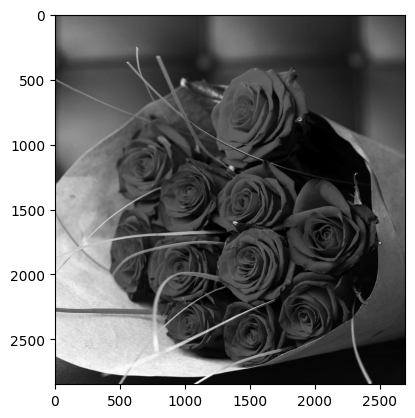

In [91]:
plt.imshow(img2, cmap='gray')
plt.show()

In [102]:
s = np.array([[2, 0],[0, 2]])
# s_inv = np.linalg.inv(s)
p = np.dot(s_inv, [1, 1])
print(p)
x_step, y_step = np.int16(np.floor(p))

[0.5 0.5]


In [26]:
@time_decorator
def copy_img_invers(image, s):
    x_step, y_step = np.dot(s, [1, 1])
    image = np.repeat(image, x_step, axis=0)
    image = np.repeat(image, y_step, axis=1)
            
    return image

copy_img_invers took 0.05197 sec
(1423, 1350) (2846, 2700)


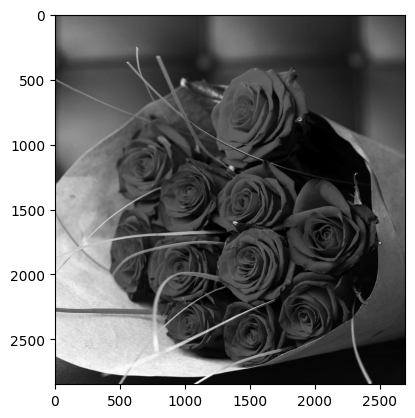

In [27]:
img = cv.imread('redRose.png', cv.IMREAD_GRAYSCALE)
s = np.array([[2, 0],[0, 2]])
img2 = copy_img_invers(img, s)
print(img.shape, img2.shape)

plt.imshow(img2, cmap='gray')
plt.show()

In [146]:
plt.imsave('redRose_doubleSize.jpg', img2, cmap='gray')

# Nearest neighbour interpolation 

In [44]:
# np.round is nearest method but at the outer boundry we will have some problem
rows, cols = img.shape
img2 = np.zeros((2*rows, 2*cols), dtype=np.uint8)
s = np.array([[2, 0],[0, 2]])
s_inv = np.linalg.inv(s)

for i in range (img2.shape[0]):
    for j in range(img2.shape[1]):
        p_prim = np.array([i, j])
        p = np.dot(s_inv, p_prim)
        p = np.int16(np.round(p))
        
        new_i, new_j = p
#         if (new_i < 0 or new_i >= img.shape[0]) or (new_j < 0 or new_j >= img.shape[1]):
#             pass
#         else:
#             img2[i, j] = img[new_i, new_j]
        
        if new_i >= img.shape[0]:
            new_i -= 1
        
        if new_j >= img.shape[1]:
            new_j -= 1
        
        img2[i, j] = img[new_i, new_j]

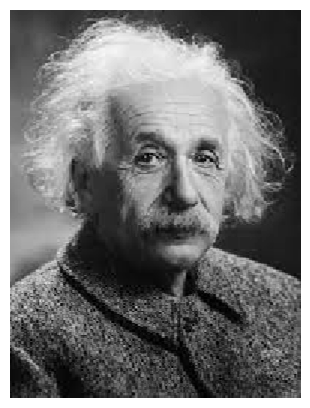

In [46]:
displayImageActualSize(img2)

# Weighted average vs simple average
in simple average we calculate average of neighbour pixel intensity 0.25*(....)
in weighted 0.25*(w1*... + w4*...)
## Bilinear interpolation

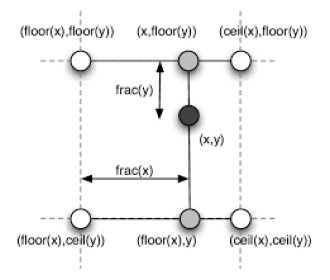

In [52]:
img = cv.imread('bilinear.png', cv.IMREAD_GRAYSCALE)
fig = plt.figure(figsize=(4,4))
plt.imshow(img, cmap='gray')
plt.axis(False)
plt.show()

In [37]:
def bilinearInterpolation(img, row, col):
    up_idx = int(row)
    down_idx = up_idx + 1
    left_idx = int(col)
    right_idx = left_idx + 1

    up_wight = abs(row - down_idx)
    down_weight = 1 - up_wight
    right_wight = abs(col - left_idx)
    left_wight = 1 - right_wight
    if (up_idx >= 0 and down_idx < img.shape[0]) and (left_idx >= 0 and right_idx < img.shape[1]):
        img_pix = {
            'upleft' : img[up_idx, left_idx],
            'upright' : img[up_idx, right_idx],
            'downleft' : img[down_idx, left_idx],
            'downright' : img[down_idx, right_idx]
        }
        
        up_point = (left_wight * img_pix['upleft']) + (right_wight * img_pix['upright'])
        down_point =(left_wight * img_pix['downleft']) + (right_wight * img_pix['downright'])
        point = (down_weight * down_point) + (up_wight * up_point)
        
        return np.uint16(point)
        
    else:
        return 0

In [180]:
bilinearInterpolation(img, -1, 0.4)

0

In [186]:
img = cv.imread('einstein.jpg', cv.IMREAD_GRAYSCALE)
rows, cols = img.shape
img2 = np.zeros((2*rows, 2*cols), dtype=np.uint8)
s = np.array([[2, 0],[0, 2]])
s_inv = np.linalg.inv(s)

for i in range (img2.shape[0]):
    for j in range(img2.shape[1]):
        p_prim = np.array([i, j])
        p = np.dot(s_inv, p_prim)
        new_i, new_j = p
            
        img2[i, j] = bilinearInterpolation(img, new_i, new_j)

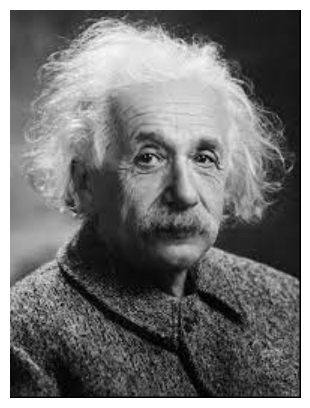

In [187]:
displayImageActualSize(img2)
plt.imsave('einstein_doubleSizeBilinear.jpg', img2, cmap='gray')

In [473]:
def img_scaler_gray(img_gray, scaler):
    rows, cols = img_gray.shape
    row_scale, col_scale = np.max(scaler, axis=1)
    img2 = np.zeros((row_scale * rows, col_scale * cols), dtype=np.uint8)
    s_inv = np.linalg.inv(scaler)

    for i in range (img2.shape[0]):
        for j in range(img2.shape[1]):
            p_prim = np.array([i, j])
            p = np.dot(s_inv, p_prim)
            new_i, new_j = p

            img2[i, j] = bilinearInterpolation(img, new_i, new_j)
    
    return img2

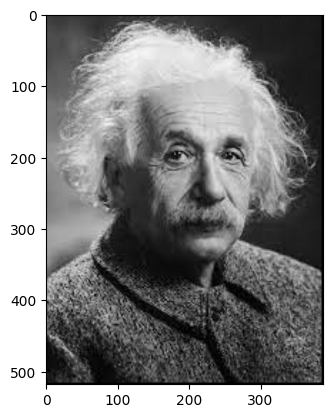

In [474]:
img = cv.imread('einstein.jpg', cv.IMREAD_GRAYSCALE)
s = np.array([[2, 0],[0, 2]])
new_img = img_scaler_gray(img, s)
plt.imshow(new_img, cmap='gray')
plt.show()

In [361]:
x = np.array(([1, 2, 3],[3, 4, 1], [5, 2, 2], [3, 5, 9]))
row, col = x.shape
s = np.array([[2, 0], [0, 2]])
s_inv = np.linalg.inv(s)
row_step, col_step = np.dot(s, [1, 1])
row_weight, col_weight = np.dot(s_inv, [1, 1])

y = np.zeros((row * row_step, col * col_step))
y[::row_step, ::col_step]= x

catalist_col = np.repeat(x, 2, axis=1)
catalist_col_ = np.hstack((catalist_col[:, 1:] , catalist_col[:, -1].reshape(-1, 1)))
av_col = np.average(catalist_col_.reshape(-1, 2), axis=1).reshape(-1, col)*(2*col_weight)

catalist_row_ = np.hstack((catalist_row[:, 1:] , catalist_row[:, -1].reshape(-1, 1)))
av_row = np.average(catalist_col_.reshape(-1, 2), axis=1).reshape((-1, row))*(2*row_weight)

y[::row_step, 1::col_step] = av_col

catalist_row = np.repeat(y[::2,:].T, 2, axis=1)
catalist_row_ = np.hstack((catalist_row[:, 1:] , catalist_row[:, -1].reshape(-1, 1)))
av_row = np.average(catalist_row_.reshape(-1, 2), axis=1).reshape(-1, row).T

y[1::row_step, :] = av_row

y

array([[1.  , 1.5 , 2.  , 2.5 , 3.  , 3.  ],
       [2.  , 2.5 , 3.  , 2.5 , 2.  , 2.  ],
       [3.  , 3.5 , 4.  , 2.5 , 1.  , 1.  ],
       [4.  , 3.5 , 3.  , 2.25, 1.5 , 1.5 ],
       [5.  , 3.5 , 2.  , 2.  , 2.  , 2.  ],
       [4.  , 3.75, 3.5 , 4.5 , 5.5 , 5.5 ],
       [3.  , 4.  , 5.  , 7.  , 9.  , 9.  ],
       [3.  , 4.  , 5.  , 7.  , 9.  , 9.  ]])

In [470]:
x = np.array([[1, 2],[3, 4]])
row, col = x.shape
s = np.array([[3, 0], [0, 2]])
s_inv = np.linalg.inv(s)
row_step, col_step = np.dot(s, [1, 1])
row_weight, col_weight = np.dot(s_inv, [1, 1])

y = np.zeros((row * row_step, col * col_step))
y[::row_step, ::col_step]= x

catalist_col = np.repeat(x, 2, axis=1)
catalist_col_ = np.hstack((catalist_col[:, 1:],
                           catalist_col[:, -1].reshape(-1, 1)))
av_col = np.average(catalist_col_.reshape(-1, 2),
                    axis=1, weights=(col_step-1, 1)).reshape(-1, col)

for j in range(1, col_step):
    y[::row_step, j::col_step] = av_col + (2 * (j-1) * col_weight) / (col_step-1)

catalist_row = np.repeat(y[::row_step,:].T, 2, axis=1)
catalist_row_ = np.hstack((catalist_row[:, 1:],
                           catalist_row[:, -1].reshape(-1, 1)))
av_row = np.average(catalist_row_.reshape(-1, 2),
                    axis=1, weights=(row_step-1, 1)).reshape(-1, row).T

for i in range(1, row_step):
    y[i::row_step, :] = av_row + (2 * (i-1) * row_weight) / (row_step-1)


[[1 2]
 [3 4]]


array([[1.        , 1.5       , 2.        , 2.        ],
       [1.66666667, 2.16666667, 2.66666667, 2.66666667],
       [2.        , 2.5       , 3.        , 3.        ],
       [3.        , 3.5       , 4.        , 4.        ],
       [3.        , 3.5       , 4.        , 4.        ],
       [3.33333333, 3.83333333, 4.33333333, 4.33333333]])

In [519]:
def img_scaler_gray_vectorize(img_gray, scaler):
    row, col = img_gray.shape
    s_inv = np.linalg.inv(scaler)
    row_step, col_step = np.dot(s, [1, 1])
    row_weight, col_weight = np.dot(s_inv, [1, 1])

    img2 = np.zeros((row * row_step, col * col_step), dtype=np.uint16)
    img2[::row_step, ::col_step]= img_gray

    catalist_col = np.repeat(img_gray, 2, axis=1)
    catalist_col_ = np.hstack((catalist_col[:, 1:],
                               catalist_col[:, -1].reshape(-1, 1)))
    av_col = np.average(catalist_col_.reshape(-1, 2),
                        axis=1, weights=(col_step-1, 1)).reshape(-1, col)

    for j in range(1, col_step):
        img2[::row_step, j::col_step] = av_col + (2 * (j-1) * col_weight) / (col_step-1)

    catalist_row = np.repeat(img2[::row_step,:].T, 2, axis=1)
    catalist_row_ = np.hstack((catalist_row[:, 1:],
                               catalist_row[:, -1].reshape(-1, 1)))
    av_row = np.average(catalist_row_.reshape(-1, 2),
                        axis=1, weights=(row_step-1, 1)).reshape(-1, row).T

    for i in range(1, row_step):
        img2[i::row_step, :] = av_row + (2 * (i-1) * row_weight) / (row_step-1)

    return img2

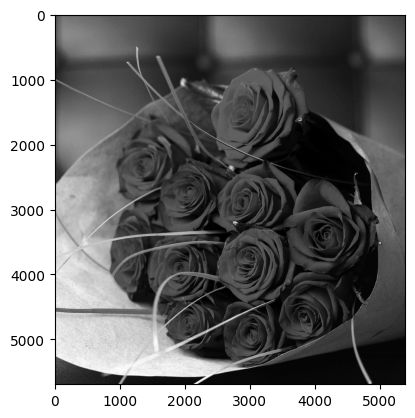

In [478]:
img = cv.imread('redRose.jpg', cv.IMREAD_GRAYSCALE)
s = np.array([[2, 0],[0, 2]])
new_img = img_scaler_gray_vectorize(img, s)
plt.imshow(new_img, cmap='gray')
plt.show()
plt.imsave('redRose_doubleSizeBilinear.jpg', new_img )

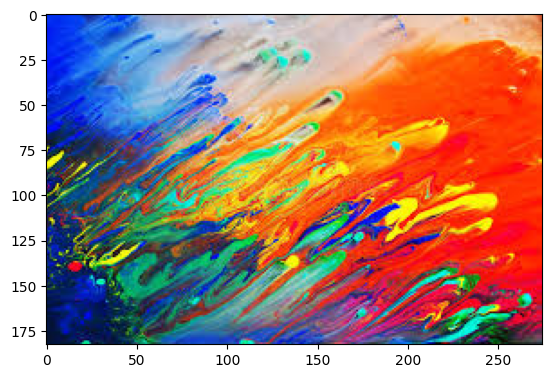

In [483]:
img = cv.imread('colorImage.jpg')
img = img[:, :, ::-1]
plt.imshow(img)
plt.show()

In [35]:
@time_decorator
def img_scaler(img, scaler):
    rows, cols , channel= img.shape
    row_scale, col_scale = np.max(scaler, axis=1)
    img2 = np.zeros((int(row_scale * rows), int(col_scale * cols), channel), dtype=np.uint8)
    s_inv = np.linalg.inv(scaler)

    for k in range(channel):
        for i in range (img2.shape[0]):
            for j in range(img2.shape[1]):
                p_prim = np.array([i, j])
                p = np.dot(s_inv, p_prim)
                new_i, new_j = p
                
                img2[i, j, k] = bilinearInterpolation(img[:,:, k], new_i, new_j)
    return img2

img_scaler took 11.88 sec


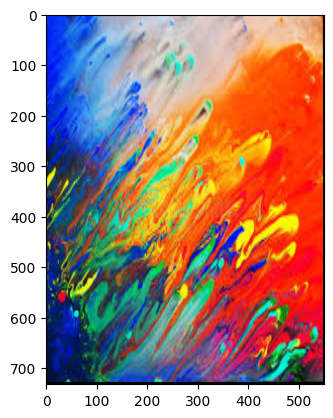

In [30]:
img = cv.imread('colorImage.jpg')
img = img[:, :, ::-1]
s = np.array([[4, 0],[0, 2]])
new_img = img_scaler(img, s)
plt.imshow(new_img)
plt.show()

In [33]:
@time_decorator
def img_scaler_vectorize(img, scaler):
    row, col, channel = img.shape
    s_inv = np.linalg.inv(scaler)
    row_step, col_step = np.dot(s, [1, 1])
    row_weight, col_weight = np.dot(s_inv, [1, 1])

    img2 = np.zeros((row * row_step, col * col_step, channel), dtype=np.uint16)
    img2[::row_step, ::col_step, :]= img

    for k in range(channel):
        catalist_col = np.repeat(img[:, :, k], 2, axis=1)
        catalist_col_ = np.hstack((catalist_col[:, 1:],
                                   catalist_col[:, -1].reshape(-1, 1)))
        av_col = np.average(catalist_col_.reshape(-1, 2),
                            axis=1, weights=(col_step-1, 1)).reshape(-1, col)

        for j in range(1, col_step):
            img2[::row_step, j::col_step, k] = av_col + (2 * (j-1) * col_weight) / (col_step-1)

        catalist_row = np.repeat(img2[::row_step,:, k].T, 2, axis=1)
        catalist_row_ = np.hstack((catalist_row[:, 1:],
                                   catalist_row[:, -1].reshape(-1, 1)))
        av_row = np.average(catalist_row_.reshape(-1, 2),
                            axis=1, weights=(row_step-1, 1)).reshape(-1, row).T

        for i in range(1, row_step):
            img2[i::row_step, :, k] = av_row + (2 * (i-1) * row_weight) / (row_step-1)

    return img2

img_scaler_vectorize took 0.03635 sec


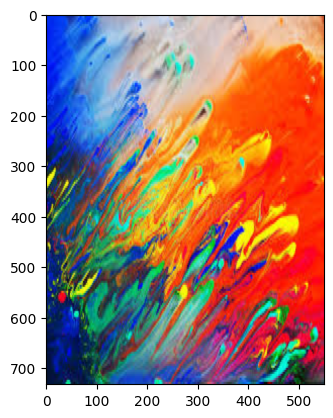

In [32]:
img = cv.imread('colorImage.jpg')
img = img[:, :, ::-1]
s = np.array([[4, 0],[0, 2]])
new_img = img_scaler_vectorize(img, s)
plt.imshow(new_img)
plt.show()

img_scaler took 1.133e+03 sec


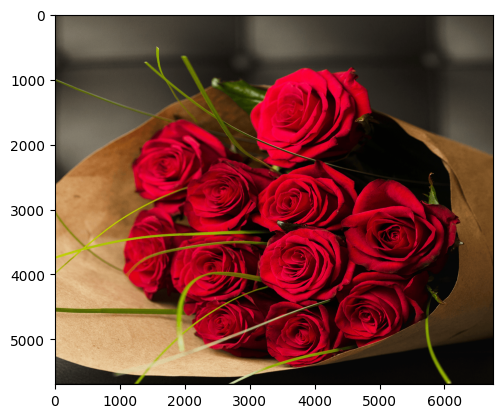

In [34]:
img = cv.imread('redRose.png')
img = img[:, :, ::-1]
s = np.array([[4, 0],[0, 5]])
new_img = img_scaler(img, s)
plt.imshow(new_img)
plt.show()

In [ ]:
img = cv.imread('redRose.png')
img = img[:, :, ::-1]
s = np.array([[4, 0],[0, 5]])
new_img = img_scaler_vectorize(img, s)
plt.imshow(new_img)
plt.show()

In [40]:
1133 / 60

18.883333333333333

In [ ]:
displayImageActualSize()

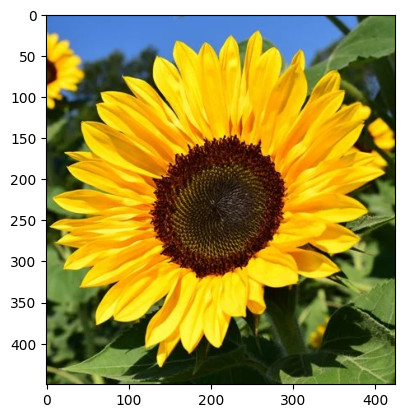

In [27]:
img = cv.imread('flower.jpg')
img = img[:, 250:, ::-1]
plt.imshow(img)
plt.show()

In [29]:
img.dtype

dtype('uint8')

In [38]:
s = np.array([[0.5, 0],[0, 0.5]])
cv_resize = cv.resize(img, (0, 0), fx = 0.5, fy=0.5)
new_img = img_scaler(img, s)

img_scaler took 1.414 sec


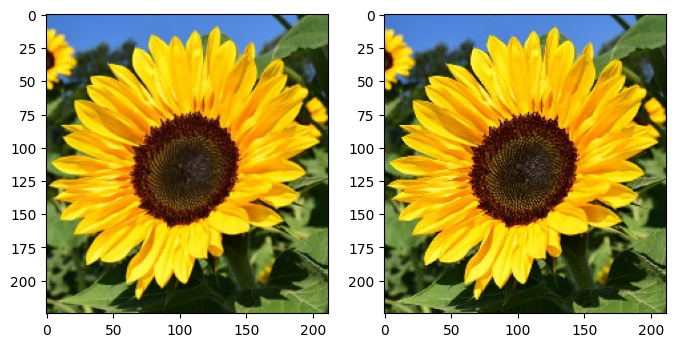

In [39]:
fig = plt.figure(figsize=(8, 4))
plt.subplot(121)
plt.imshow(cv_resize)
plt.subplot(122)
plt.imshow(new_img)
plt.show()

img_scaler_vectorize took 14.98 sec


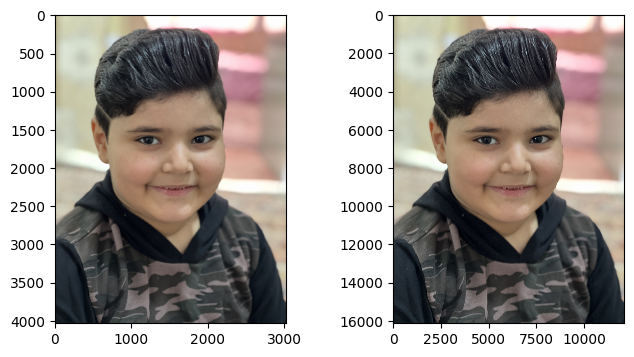

In [16]:
img = cv.imread('img_copy.jpg')
img = img[:, :, ::-1]
s = np.array([[4, 0],[0, 4]])
new_img = img_scaler_vectorize(img, s)

fig = plt.figure(figsize=(8, 4))
plt.subplot(121)
plt.imshow(img)
plt.subplot(122)
plt.imshow(new_img)
plt.show()

In [21]:
img2 = new_img.astype(np.uint8)

In [23]:
plt.imsave('img_copy_copy.jpg', img2 )